# Liquidity-Filtered Portfolio Optimization Backtest (v2)

This notebook is a step-by-step rewrite of your original script with **minimal structural changes**, but with the following fixes/enhancements applied (and explanations updated to match):

## Changes implemented
1) **Rebalance timing = trade at OPEN (approx.)**
- We use close-to-close returns.
- To approximate “trade at open”, we **rebalance BEFORE applying day `dt` returns**:
  - At the **start** of the `dt` loop: if `dt` is rebalance day, compute `w_tar`, apply transaction costs to `net_value`, and set weights to `w_tar`.
  - Then apply day `dt` returns to gross/net using the **new** weights.
  - Then drift weights to the close to carry into the next day.

2) **Optional shift of month-end rebalance to next trading day**
- Toggle `SHIFT_REBAL_TO_NEXT_DAY = True/False`.
- If True: compute month-end dates as before, then map each to the **next** available trading date in `returns.index`.

3) **CVXPY solver fallback actually works**
- Per-solver keyword args:
  - OSQP: `max_iter`
  - ECOS/SCS: `max_iters`
- Keep `warm_start=True`.
- If a solver fails or returns NaNs, we try the next one.

4) **Transaction costs consistency with turnover**
- Turnover is computed as `0.5 * sum(abs(delta))`.
- Costs are charged on the **same one-way turnover**:
  - `tc_rate_from_delta(delta) = (bps/10000) * 0.5 * sum(abs(delta))`.

5) **Remove “Lasso MV”**
- With long-only and sum(w)=1, `norm1(w)` is constant, so L1 penalty does nothing.
- We remove the “Lasso MV” strategy entirely.

6) **Add Max Sharpe (Global) via bisection + SOCP feasibility**
- Deterministic, convex feasibility checks, no local minima.
- Added as a separate strategy for comparison.

7) **Keep existing covariance estimators + add EWMA**
- SampleCov, LedoitWolf, OAS remain.
- EWMA covariance is added to `cov_ann_map["EWMA"]`.
- Minimal additional strategies: `MinVar (EWMA)` and `MV (EWMA)`.

8) **Per-strategy dashboard plots**
For each strategy we show a 2×2 subplot:
- Net equity curve
- Net drawdown
- Top-10 weights (latest rebalance)
- Top-10 risk contributions (latest rebalance)

At the end we still print the same summary tables and the same “all strategies” plots.


## 1) Imports and plotting style


In [15]:
import warnings
warnings.filterwarnings("ignore")

import cvxpy as cp
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.dates import DateFormatter
from scipy.optimize import minimize
from sklearn.covariance import LedoitWolf, OAS
from cycler import cycler

colors = ["#069AF3","#FE420F", "#00008B", "#008080", "#800080",
          "#7BC8F6", "#0072B2","#04D8B2", "#CC79A7", "#DC143C","#008000"]
plt.rcParams["axes.prop_cycle"] = cycler(color=colors)
plt.rcParams.update({
    "figure.figsize": (6, 3),
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "axes.grid": True,
    "grid.alpha": 0.20,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
})


## 2) Configuration (experiment knobs)

This block controls the entire experiment.

### Constraints
We impose:
- Fully invested: $\sum_i w_i = 1$
- Long-only: $w_i \ge 0$ (if `LONG_ONLY=True`)
- Box bounds: $w_{min} \le w_i \le w_{max}$

Feasibility requires:
- $w_{max}\,N \ge 1$
- $w_{min}\,N \le 1$

### Costs
If enabled, costs are proportional to L1 turnover:
- $\Delta w = w^{post} - w^{pre}$
- Cost rate $c = \text{bps}\cdot \sum_i |\Delta w_i|$

Turnover is reported as:
$$
\text{turnover} = \frac{1}{2}\sum_i |\Delta w_i|
$$


- `SHIFT_REBAL_TO_NEXT_DAY`: if True, month-end dates are mapped to the next trading day (trade at open after month-end).

In [16]:
# ===== minimal settings (keep behavior similar to original) =====
DATA_PATH = r"E:\daneshgah\quantitative-finance-lab\data\nasdaq_all_close_volume.parquet"
DATE_COL = "Date"

START = "2016-01-01"
END = None

RETURNS_TYPE = "simple"
REBAL_FREQ = "M"
SHIFT_REBAL_TO_NEXT_DAY = True   # NEW: month-end -> next trading day (recommended for "trade at open")

LOOKBACK = 250
LIQ_LOOKBACK = 250
TOP_N = 100
MIN_HISTORY = 250

RISK_FREE_ANNUAL = 0.04
LONG_ONLY, W_MIN, W_MAX = True, 0.0, 0.40

COSTS_ENABLED, COST_BPS, FIXED_FEE = True, 10.0, 0.0

MV_LAMBDA = 16.0
RIDGE_MV_GAMMA = 8.0
RIDGE_OBJ = 1e-4
TURNOVER_PENALTY_BPS = 0.0
USE_COST_AS_PENALTY = True

SOLVER_ORDER = ["OSQP", "ECOS", "SCS"]
JITTER, PSD_EPS, MAX_ITER = 1e-10, 1e-10, 8000

MU_MODE = "6-1"
WINSOR_LO, WINSOR_HI = 0.05, 0.95
TARGET_SHARPE_ANN, MU_CAP_ANN = 0.80, 0.30
APPLY_MU_SHRINK, MU_SHRINK = False, 0.40

FRONTIER_GRID_N = 10          # NEW: small grid = faster

# EWMA covariance (NEW)
EWMA_LAMBDA = 0.94  # RiskMetrics-style default

# Blending (turnover reduction)
BLEND = {
    "MV (SampleCov)": 0.15,
    "MV (LedoitWolf)": 0.15,
    "MV (OAS)": 0.15,
    "MV (EWMA)": 0.15,
    "Ridge MV": 0.15,

    "MaxSharpe": 0.10,                 # keep your SLSQP baseline
    "MaxSharpe (MV Sweep)": 0.10,      # NEW
    "MaxSharpe (FrontierGrid)": 0.10,  # NEW

    "MinVar (SampleCov)": 0.20,
    "MinVar (LedoitWolf)": 0.20,
    "MinVar (OAS)": 0.20,
    "MinVar (EWMA)": 0.20,
}

strategy_cov_key = {
    "EW": "LedoitWolf",

    "MinVar (SampleCov)": "SampleCov",
    "MinVar (LedoitWolf)": "LedoitWolf",
    "MinVar (OAS)": "OAS",
    "MinVar (EWMA)": "EWMA",

    "MV (SampleCov)": "SampleCov",
    "MV (LedoitWolf)": "LedoitWolf",
    "MV (OAS)": "OAS",
    "MV (EWMA)": "EWMA",

    "Ridge MV": "LedoitWolf",

    "MaxSharpe": "LedoitWolf",                 # baseline SLSQP
    "MaxSharpe (MV Sweep)": "LedoitWolf",      # NEW
    "MaxSharpe (FrontierGrid)": "LedoitWolf",  # NEW
}
strategy_names = list(strategy_cov_key.keys())


## 2.5) Math primer (the exact objects we estimate and optimize)

### Returns
- Simple returns: $r_{t,i} = \frac{P_{t,i}}{P_{t-1,i}} - 1$
- Log returns: $r_{t,i} = \log(P_{t,i}) - \log(P_{t-1,i})$

### Annualization
We use $252$ trading days/year:
- $\Sigma_{ann} = 252\,\Sigma_{daily}$
- $\sigma_{ann} = \sigma_{daily}\sqrt{252}$

### Portfolio return and drift
Given weights $w_{t-1}$ and today returns $r_t$:
- Portfolio return: $r^{port}_t = \sum_i w_{t-1,i} r_{t,i}$

If we do **not** trade at day $t$, weights drift:
$$
\tilde{w}_{t,i} = \frac{w_{t-1,i}(1+r_{t,i})}{\sum_j w_{t-1,j}(1+r_{t,j})}
$$

### Turnover and costs at rebalance
Let $w^{pre}$ be drifted weights and $w^{post}$ be the post-trade weights:
- $\Delta w = w^{post} - w^{pre}$
- Turnover (reported): $\frac{1}{2}\sum_i |\Delta w_i|$
- Linear cost rate (bps): $\frac{\text{bps}}{10000}\sum_i |\Delta w_i|$

This notebook reports both turnover and realized cost impact on the **net** curve.

### Transaction cost consistency
Turnover is defined as:
$$
turnover = \frac{1}{2}\sum_i |\Delta w_i|
$$
So we charge costs on the same one-way turnover:
$$
cost\ rate = \frac{bps}{10000}\cdot \frac{1}{2}\sum_i |\Delta w_i|
$$


## 3) Helper functions

### 3.1 PSD repair
Some estimated covariances can be numerically indefinite. We enforce PSD by clipping eigenvalues:
- Symmetrize: $\Sigma \leftarrow (\Sigma+\Sigma^T)/2$
- Eigen-decompose: $\Sigma = V\Lambda V^T$
- Clip: $\Lambda_{ii} \leftarrow \max(\Lambda_{ii}, \epsilon)$
- Reconstruct: $\Sigma \leftarrow V\Lambda V^T$

### 3.2 Weight normalization under bounds
We clip and renormalize to enforce:
- long-only: $w_i \ge 0$
- bounds: $w_{min} \le w_i \le w_{max}$
- sum-to-1: $\sum_i w_i = 1$

### 3.3 Blending
$$w^{blend} = (1-\eta)\,w^* + \eta\,w^{pre}$$

### 3.4 Costs and penalties
- Cost rate: $c = \text{bps}\cdot \sum_i |\Delta w_i|$
- Optimizer L1 penalty coefficient is annualized via the rebalance frequency.

### CVXPY solver fallback
- OSQP uses `max_iter`.
- ECOS/SCS use `max_iters`.
We validate solutions (no NaNs) before accepting.


In [17]:
def format_date_axis(ax):
    ax.xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    ax.figure.autofmt_xdate()

def print_warn(msg):
    print(f"[WARN] {msg}")

def make_psd(sigma, eps=1e-10):
    sigma = 0.5 * (sigma + sigma.T)
    vals, vecs = np.linalg.eigh(sigma)
    vals = np.maximum(vals, eps)
    out = (vecs * vals) @ vecs.T
    return 0.5 * (out + out.T)

def safe_normalize_weights(w, w_min, w_max, long_only):
    w = np.asarray(w, dtype=np.float64).flatten()
    if long_only:
        w = np.maximum(w, 0.0)
    if w_min is not None:
        w = np.maximum(w, w_min)
    if w_max is not None:
        w = np.minimum(w, w_max)
    s = w.sum()
    if (not np.isfinite(s)) or s <= 0:
        return None
    w = w / s
    for _ in range(2):
        if long_only:
            w = np.maximum(w, 0.0)
        if w_min is not None:
            w = np.maximum(w, w_min)
        if w_max is not None:
            w = np.minimum(w, w_max)
        s = w.sum()
        if s <= 0:
            return None
        w = w / s
    return w

def blend_weights(w_star, w_prev, eta):
    eta = float(np.clip(eta, 0.0, 1.0))
    return (1.0 - eta) * np.asarray(w_star, dtype=np.float64) + eta * np.asarray(w_prev, dtype=np.float64)

def constraints_feasible(nn, w_min, w_max, long_only):
    w_min_eff = 0.0 if long_only else (-np.inf if w_min is None else w_min)
    w_max_eff = np.inf if w_max is None else w_max
    if np.isfinite(w_max_eff) and w_max_eff * nn < 1.0 - 1e-9:
        return False
    if np.isfinite(w_min_eff) and w_min_eff * nn > 1.0 + 1e-9:
        return False
    return True

def rebalances_per_year(rebal_dates_index):
    if len(rebal_dates_index) < 2:
        return 1.0
    d = pd.to_datetime(rebal_dates_index).values
    gaps = np.diff(d).astype("timedelta64[D]").astype(int)
    med_days = max(float(np.median(gaps)), 1.0)
    return 252.0 / med_days

def tc_rate_from_delta(delta):
    if not COSTS_ENABLED:
        return 0.0
    # NEW: costs charged on one-way turnover (consistent with turnover = 0.5*sum|delta|)
    return float((COST_BPS / 10000.0) * 0.5 * np.sum(np.abs(delta)))

def kappa_annual(rebals_per_year_value):
    k = 0.0
    if USE_COST_AS_PENALTY and COSTS_ENABLED:
        k += COST_BPS / 10000.0
    k += TURNOVER_PENALTY_BPS / 10000.0
    return float(rebals_per_year_value * k)


## 4) Expected return model $\mu$

### Momentum (direction)
For a selected window of returns:
$$
\text{Mom}_i = \prod_t (1+r_{t,i}) - 1
$$

### Winsorize + z-score
$$
z_i = \frac{x_i - \bar{x}}{\sigma_x + \epsilon}
$$

### Scale to target Sharpe
Given annual covariance $\Sigma$:
$$
q = \mu^T \Sigma^{-1}\mu
$$
$$
\mu \leftarrow \frac{\text{TargetSharpe}}{\sqrt{q}}\,\mu
$$
Then cap each component to $\pm \mu_{cap}$.


In [18]:
def momentum_score_from_returns(ret_window, mode="6-1"):
    R = ret_window.replace([np.inf, -np.inf], np.nan).dropna(how="any")
    T = len(R)
    if T < 80:
        return R.mean().values.astype(np.float64)
    if mode == "12-1":
        lookback, skip = 252, 21
    elif mode == "6-1":
        lookback, skip = 126, 21
    elif mode == "3-0":
        lookback, skip = 63, 0
    else:
        raise ValueError("Unknown momentum mode")
    if T < lookback + skip + 5:
        lookback = min(lookback, max(63, T - skip - 1))
    R_use = R.iloc[-(lookback + skip):]
    R_mom = R_use.iloc[:-skip] if skip > 0 else R_use
    return ((1.0 + R_mom).prod(axis=0) - 1.0).values.astype(np.float64)



def winsorize_and_zscore(x, p_lo=0.05, p_hi=0.95):
    x = np.asarray(x, dtype=np.float64)
    lo, hi = np.quantile(x, [p_lo, p_hi])
    x = np.clip(x, lo, hi)
    x = x - x.mean()
    return x / (x.std() + 1e-12)

def scale_mu_to_target_sharpe(mu_dir, cov_ann, target_sharpe_ann, mu_cap_ann):
    mu = np.asarray(mu_dir, dtype=np.float64).flatten()
    if np.all(np.abs(mu) < 1e-12):
        return np.zeros_like(mu)
    A = cov_ann + 1e-8 * np.eye(cov_ann.shape[0])
    try:
        x = np.linalg.solve(A, mu)
    except np.linalg.LinAlgError:
        x = np.linalg.lstsq(A, mu, rcond=None)[0]
    q = float(mu @ x)
    if (not np.isfinite(q)) or q <= 1e-18:
        return np.zeros_like(mu)
    s = float(target_sharpe_ann) / np.sqrt(q)
    return np.clip(s * mu, -mu_cap_ann, mu_cap_ann)


## 5) Load data and compute returns

We expect the parquet to contain:
- a `Date` column
- many columns like `TICKER__close` and `TICKER__volume`

We build:
- `close_prices[date, ticker]`
- `volumes[date, ticker]`
- `returns[date, ticker]`

Returns:
- simple: $r_t = P_t/P_{t-1} - 1$
- log: $r_t = \log P_t - \log P_{t-1}$


In [19]:
df = pd.read_parquet(DATA_PATH)
df[DATE_COL] = pd.to_datetime(df[DATE_COL], errors="coerce")
df = df.dropna(subset=[DATE_COL]).sort_values(DATE_COL)

close_map, vol_map = {}, {}
for c in df.columns:
    c = str(c)
    if c == DATE_COL or "__" not in c:
        continue
    t, f = c.rsplit("__", 1)
    f = f.lower()
    if f == "close":
        close_map[t] = c
    elif f == "volume":
        vol_map[t] = c

common = sorted(set(close_map).intersection(vol_map))
if len(common) < 2:
    raise ValueError("Not enough close/volume ticker pairs.")

close_prices = df[[close_map[t] for t in common]].copy(); close_prices.columns = common
volumes = df[[vol_map[t] for t in common]].copy(); volumes.columns = common
close_prices.index = df[DATE_COL]
volumes.index = df[DATE_COL]

close_prices = close_prices.apply(pd.to_numeric, errors="coerce").replace([np.inf, -np.inf], np.nan).astype(np.float32)
volumes = volumes.apply(pd.to_numeric, errors="coerce").replace([np.inf, -np.inf], np.nan).astype(np.float32)

start = pd.Timestamp(START)
end = pd.Timestamp(END) if END else None
close_prices = close_prices.loc[close_prices.index >= start]
volumes = volumes.loc[volumes.index >= start]
if end is not None:
    close_prices = close_prices.loc[close_prices.index <= end]
    volumes = volumes.loc[volumes.index <= end]

idx = close_prices.index.intersection(volumes.index)
cols = close_prices.columns.intersection(volumes.columns)
close_prices = close_prices.loc[idx, cols]
volumes = volumes.loc[idx, cols]

if RETURNS_TYPE == "log":
    returns = np.log(close_prices).diff()
else:
    returns = close_prices.pct_change(fill_method=None)
returns = returns.replace([np.inf, -np.inf], np.nan).astype(np.float32)

print("close_prices:", close_prices.shape, "volumes:", volumes.shape, "returns:", returns.shape)
print("Date range:", returns.index.min().date(), "to", returns.index.max().date())


close_prices: (2532, 4382) volumes: (2532, 4382) returns: (2532, 4382)
Date range: 2016-01-04 to 2026-01-28


## 6) Rebalance dates (month-end and optional shift to next trading day)

- First compute period end dates using `resample(REBAL_FREQ).last()`.
- If `SHIFT_REBAL_TO_NEXT_DAY=True`, map each period-end date to the **next** available trading date in `returns.index`.

This supports: “trade at open on the first trading day after month-end” using month-end close as “yesterday”.

We rebalance at the last available trading day of each period:
- Monthly: `REBAL_FREQ = "M"`



In [20]:
rebal_dates_raw = (
    returns.groupby(pd.Grouper(freq=REBAL_FREQ))
           .apply(lambda x: x.index[-1])
           .dropna()
)
rebal_dates_raw = pd.DatetimeIndex(rebal_dates_raw.values)




if SHIFT_REBAL_TO_NEXT_DAY:
    all_idx = returns.index.values
    mapped = []
    for d in rebal_dates_raw:
        j = np.searchsorted(all_idx, np.datetime64(d) + np.timedelta64(1, "ns"), side="left")
        if j < len(all_idx):
            mapped.append(pd.Timestamp(all_idx[j]))
    rebal_dates = pd.DatetimeIndex(mapped)
else:
    rebal_dates = rebal_dates_raw

print("Candidate rebalance dates:", len(rebal_dates))
print("First 3:", [d.date() for d in rebal_dates[:3]])
print("Last 3:", [d.date() for d in rebal_dates[-3:]])


Candidate rebalance dates: 120
First 3: [datetime.date(2016, 2, 1), datetime.date(2016, 3, 1), datetime.date(2016, 4, 1)]
Last 3: [datetime.date(2025, 11, 3), datetime.date(2025, 12, 1), datetime.date(2026, 1, 2)]


## 7) Liquidity selection + covariance estimation (add EWMA)

Liquidity (same as original):
$$
DV_i = \frac{1}{T}\sum_t P_{t,i}Vol_{t,i}
$$

Covariance estimators:
- SampleCov
- LedoitWolf
- OAS
- EWMA

EWMA recursion on demeaned returns $x_t$:
$$
S_t = \lambda S_{t-1} + (1-\lambda) x_t x_t^T
$$
We rescale by $(1-\lambda^T)$ so magnitudes are comparable,

Then annualize and enforce PSD:
$$
\Sigma_{ann} = 252\,\Sigma_{daily}
$$



In [21]:
def select_liquid_universe(close_window, volume_window, top_n, min_history_days):
    valid_close = close_window.notna().sum(axis=0) >= min_history_days
    valid_volume = volume_window.notna().sum(axis=0) >= min_history_days
    complete_close = close_window.notna().all(axis=0)
    complete_volume = volume_window.notna().all(axis=0)
    positive = (close_window > 0).all(axis=0) & (volume_window > 0).all(axis=0)
    eligible = close_window.columns[valid_close & valid_volume & complete_close & complete_volume & positive]
    if len(eligible) == 0:
        return [], pd.Series(dtype=np.float32)
    dollar_volume = (close_window[eligible] * volume_window[eligible]).mean(axis=0, skipna=False)
    dollar_volume = dollar_volume.replace([np.inf, -np.inf], np.nan).dropna()
    top = dollar_volume.nlargest(min(int(top_n), len(dollar_volume)))
    return top.index.tolist(), top.astype(np.float32)

def ewma_covariance(x, lam=0.94):
    x = x - x.mean(axis=0, keepdims=True)
    T, N = x.shape
    S = np.zeros((N, N), dtype=np.float64)
    a = 1.0 - lam
    for t in range(T):
        xt = x[t][:, None]
        S = lam * S + a * (xt @ xt.T)
    scale = 1.0 - (lam ** max(T, 1))
    if scale > 1e-12:
        S = S / scale
    return S

def estimate_covariance_maps(window):
    x = window.values.astype(np.float64)
    nn = x.shape[1]

    cov_daily = {
        "SampleCov": np.cov(x, rowvar=False, ddof=1).astype(np.float64),
        "LedoitWolf": LedoitWolf().fit(x).covariance_.astype(np.float64),
        "OAS": OAS().fit(x).covariance_.astype(np.float64),
        "EWMA": ewma_covariance(x, lam=EWMA_LAMBDA).astype(np.float64),
    }

    out = {}
    for k, c in cov_daily.items():
        c = 0.5 * (c + c.T)
        c += JITTER * np.eye(nn)
        out[k] = 252.0 * make_psd(c, PSD_EPS)
    return out


## 9) Optimization solvers (CVXPY + SLSQP)

### MinVar
$$
\min_w\ w^T\Sigma w + \kappa\|w-w^{prev}\|_1 + \frac{\rho}{2}\|w\|_2^2
$$

### MV
$$
\max_w\ \mu^T w - \frac{\lambda}{2}w^T\Sigma w - \kappa\|w-w^{prev}\|_1 - \frac{\rho}{2}\|w\|_2^2
$$

### Ridge/Lasso MV
Add $\gamma_1\|w\|_1$ and $\frac{\gamma_2}{2}\|w\|_2^2$ penalties.

### MaxSharpe
$$
\max_w\ \frac{\mu^T w}{\sqrt{w^T\Sigma w}}
$$
Solved numerically (SLSQP) by minimizing the negative Sharpe with penalties.

We cache CVXPY problem templates for speed.



### Strategy mapping (what differs between them)

All strategies share the same constraint set and rebalance schedule. They differ in:

1. **Objective form** (MinVar vs MV vs MaxSharpe vs regularized MV)  
2. **Covariance estimator** (SampleCov vs LedoitWolf vs OAS)  
3. **Regularization** (ridge/lasso)  
4. **Turnover penalty** (optional L1 penalty via $\kappa$)  
5. **Blending** $w^{blend} = (1-\eta)w^* + \eta w^{pre}$

**Expected returns $\mu$** are produced by the momentum + scaling routine once per rebalance date and used by:
- MV (all 3 covariance flavors)
- Ridge MV
- Lasso MV
- MaxSharpe

MinVar ignores $\mu$ and depends only on $\Sigma$.

MaxSharpe (FrontierGrid): build QP frontier by target returns and choose best Sharpe

In [22]:
cvx_cache = {}

def solve_cvx(prob, var):
    for solver in SOLVER_ORDER:
        try:
            if solver == "OSQP":
                kwargs = {"max_iter": MAX_ITER}
            elif solver in ("ECOS", "SCS"):
                kwargs = {"max_iters": MAX_ITER}
            else:
                kwargs = {}
            prob.solve(solver=solver, warm_start=True, **kwargs)

            if var.value is not None:
                w = np.asarray(var.value, dtype=np.float64).flatten()
                if np.all(np.isfinite(w)):
                    return w
        except Exception:
            continue
    return None

def get_mv_solver(nn, mv_lambda, ridge, kappa):
    key = ("mv", nn, mv_lambda, ridge, kappa, W_MIN, W_MAX, LONG_ONLY)
    if key in cvx_cache:
        return cvx_cache[key]
    w = cp.Variable(nn)
    mu = cp.Parameter(nn)
    S = cp.Parameter((nn, nn), PSD=True)
    w_prev = cp.Parameter(nn)
    cons = []
    if LONG_ONLY:
        cons.append(w >= 0)
    if W_MIN is not None:
        cons.append(w >= W_MIN)
    if W_MAX is not None:
        cons.append(w <= W_MAX)
    cons.append(cp.sum(w) == 1)
    obj = cp.Maximize(mu @ w - 0.5 * mv_lambda * cp.quad_form(w, S)
                      - kappa * 0.5 * cp.norm1(w - w_prev)
                      - 0.5 * ridge * cp.sum_squares(w))
    prob = cp.Problem(obj, cons)
    cvx_cache[key] = (prob, w, mu, S, w_prev)
    return prob, w, mu, S, w_prev

def get_reg_mv_solver(nn, mv_lambda, ridge, kappa, gamma_l2):
    key = ("ridge_mv", nn, mv_lambda, ridge, kappa, gamma_l2, W_MIN, W_MAX, LONG_ONLY)
    if key in cvx_cache:
        return cvx_cache[key]
    w = cp.Variable(nn)
    mu = cp.Parameter(nn)
    S = cp.Parameter((nn, nn), PSD=True)
    w_prev = cp.Parameter(nn)
    cons = []
    if LONG_ONLY:
        cons.append(w >= 0)
    if W_MIN is not None:
        cons.append(w >= W_MIN)
    if W_MAX is not None:
        cons.append(w <= W_MAX)
    cons.append(cp.sum(w) == 1)
    obj = cp.Maximize(mu @ w - 0.5 * mv_lambda * cp.quad_form(w, S)
                      - kappa * 0.5 * cp.norm1(w - w_prev)
                      - 0.5 * ridge * cp.sum_squares(w)
                      - 0.5 * gamma_l2 * cp.sum_squares(w))
    prob = cp.Problem(obj, cons)
    cvx_cache[key] = (prob, w, mu, S, w_prev)
    return prob, w, mu, S, w_prev

def get_minvar_solver(nn, ridge, kappa):
    key = ("minvar", nn, ridge, kappa, W_MIN, W_MAX, LONG_ONLY)
    if key in cvx_cache:
        return cvx_cache[key]
    w = cp.Variable(nn)
    S = cp.Parameter((nn, nn), PSD=True)
    w_prev = cp.Parameter(nn)
    cons = []
    if LONG_ONLY:
        cons.append(w >= 0)
    if W_MIN is not None:
        cons.append(w >= W_MIN)
    if W_MAX is not None:
        cons.append(w <= W_MAX)
    cons.append(cp.sum(w) == 1)
    obj = cp.Minimize(cp.quad_form(w, S) + kappa * 0.5 * cp.norm1(w - w_prev) + 0.5 * ridge * cp.sum_squares(w))
    prob = cp.Problem(obj, cons)
    cvx_cache[key] = (prob, w, S, w_prev)
    return prob, w, S, w_prev

def mv_weights(mu_excess_ann, cov_ann, w_prev, rpy):
    nn = len(mu_excess_ann)
    if not constraints_feasible(nn, W_MIN, W_MAX, LONG_ONLY):
        return None
    prob, w_var, mu_p, S_p, wprev_p = get_mv_solver(nn, MV_LAMBDA, RIDGE_OBJ, kappa_annual(rpy))
    mu_p.value = np.asarray(mu_excess_ann, dtype=np.float64)
    S_p.value = np.asarray(cov_ann, dtype=np.float64)
    wprev_p.value = np.asarray(w_prev, dtype=np.float64)
    w = solve_cvx(prob, w_var)
    return None if w is None else safe_normalize_weights(w, W_MIN, W_MAX, LONG_ONLY)

def ridge_mv_weights(mu_excess_ann, cov_ann, w_prev, rpy):
    nn = len(mu_excess_ann)
    if not constraints_feasible(nn, W_MIN, W_MAX, LONG_ONLY):
        return None
    g2 = RIDGE_MV_GAMMA / max(nn, 1)
    prob, w_var, mu_p, S_p, wprev_p = get_reg_mv_solver(nn, MV_LAMBDA, RIDGE_OBJ, kappa_annual(rpy), g2)
    mu_p.value = np.asarray(mu_excess_ann, dtype=np.float64)
    S_p.value = np.asarray(cov_ann, dtype=np.float64)
    wprev_p.value = np.asarray(w_prev, dtype=np.float64)
    w = solve_cvx(prob, w_var)
    return None if w is None else safe_normalize_weights(w, W_MIN, W_MAX, LONG_ONLY)

def minvar_weights(cov_ann, w_prev, rpy):
    nn = cov_ann.shape[0]
    if not constraints_feasible(nn, W_MIN, W_MAX, LONG_ONLY):
        return None
    prob, w_var, S_p, wprev_p = get_minvar_solver(nn, RIDGE_OBJ, kappa_annual(rpy))
    S_p.value = np.asarray(cov_ann, dtype=np.float64)
    wprev_p.value = np.asarray(w_prev, dtype=np.float64)
    w = solve_cvx(prob, w_var)
    return None if w is None else safe_normalize_weights(w, W_MIN, W_MAX, LONG_ONLY)

def max_sharpe_weights(mu_excess_ann, cov_ann, w_prev, rpy):
    nn = len(mu_excess_ann)
    if not constraints_feasible(nn, W_MIN, W_MAX, LONG_ONLY):
        return None
    bounds = [(0.0 if LONG_ONLY else (-1.0 if W_MIN is None else W_MIN), 1.0 if W_MAX is None else W_MAX) for _ in range(nn)]
    x0 = np.ones(nn, dtype=np.float64) / nn
    kappa, ridge = kappa_annual(rpy), RIDGE_OBJ
    mu_use = np.asarray(mu_excess_ann, dtype=np.float64)

    def neg_obj(w):
        w = np.asarray(w, dtype=np.float64)
        if np.any(~np.isfinite(w)):
            return 1e6
        ret = float(mu_use @ w)
        vol = float(np.sqrt(w @ cov_ann @ w))
        if vol < 1e-12:
            return 1e6
        return -(ret / vol) + kappa * 0.5 * np.sum(np.abs(w - w_prev)) + 0.5 * ridge * np.sum(w**2)

    res = minimize(neg_obj, x0, method="SLSQP", bounds=bounds,
                   constraints=({"type": "eq", "fun": lambda w: np.sum(w) - 1.0},),
                   options={"maxiter": MAX_ITER})
    if (not res.success) or np.any(~np.isfinite(res.x)):
        return None
    return safe_normalize_weights(res.x, W_MIN, W_MAX, LONG_ONLY)

def _sharpe_from_w(mu_excess_ann, cov_ann, w):
    w = np.asarray(w, dtype=np.float64).flatten()
    r = float(np.dot(mu_excess_ann, w))
    v = float(np.sqrt(max(w @ cov_ann @ w, 1e-18)))
    return r / v if v > 1e-12 else -np.inf


def get_frontier_solver(nn, ridge, kappa):
    """
    NEW: Efficient frontier QP solver (target-return constraint).
    Minimize variance (+ optional turnover/ridge penalties) subject to mu^T w >= r_target.
    """
    key = ("frontier", nn, ridge, kappa, W_MIN, W_MAX, LONG_ONLY)
    if key in cvx_cache:
        return cvx_cache[key]

    w = cp.Variable(nn)
    mu = cp.Parameter(nn)
    S = cp.Parameter((nn, nn), PSD=True)
    w_prev = cp.Parameter(nn)
    r_target = cp.Parameter(nonneg=False)

    cons = []
    if LONG_ONLY:
        cons.append(w >= 0)
    if W_MIN is not None:
        cons.append(w >= W_MIN)
    if W_MAX is not None:
        cons.append(w <= W_MAX)
    cons.append(cp.sum(w) == 1)
    cons.append(mu @ w >= r_target)

    # "Frontier" objective: variance + (optional) turnover penalty + ridge (matches your style)
    obj = cp.Minimize(
        cp.quad_form(w, S)
        + kappa * cp.norm1(w - w_prev)
        + 0.5 * ridge * cp.sum_squares(w)
    )
    prob = cp.Problem(obj, cons)
    cvx_cache[key] = (prob, w, mu, S, w_prev, r_target)
    return prob, w, mu, S, w_prev, r_target


def _greedy_max_return_weight(mu, w_max):
    mu = np.asarray(mu, dtype=np.float64).flatten()
    n = len(mu)
    order = np.argsort(mu)[::-1]
    w = np.zeros(n, dtype=np.float64)
    cap = np.inf if w_max is None else float(w_max)
    remaining = 1.0
    for i in order:
        if remaining <= 1e-12:
            break
        add = min(cap, remaining)
        w[i] = add
        remaining -= add
    if remaining > 1e-6:
        return None
    return w


def max_sharpe_frontier_grid_weights(mu_excess_ann, cov_ann, w_prev, rpy, grid_n=10):
    """
    NEW: Max Sharpe via Frontier Grid (QP).
    Build an (estimated) constrained frontier using target-return QPs,
    then pick the point with maximum Sharpe.
    """
    nn = len(mu_excess_ann)
    if not constraints_feasible(nn, W_MIN, W_MAX, LONG_ONLY):
        return None

    # endpoints for return grid
    w_minv = minvar_weights(cov_ann, w_prev, rpy)
    if w_minv is None:
        w_minv = np.ones(nn, dtype=np.float64) / nn

    w_maxr = _greedy_max_return_weight(mu_excess_ann, W_MAX)
    if w_maxr is None:
        return None

    r_lo = float(np.dot(mu_excess_ann, w_minv))
    r_hi = float(np.dot(mu_excess_ann, w_maxr))
    if not np.isfinite(r_lo) or not np.isfinite(r_hi) or r_hi <= r_lo + 1e-12:
        return None

    targets = np.linspace(r_lo, r_hi, int(grid_n))

    prob, w_var, mu_p, S_p, wprev_p, r_p = get_frontier_solver(nn, RIDGE_OBJ, kappa_annual(rpy))
    mu_p.value = np.asarray(mu_excess_ann, dtype=np.float64)
    S_p.value = np.asarray(cov_ann, dtype=np.float64)
    wprev_p.value = np.asarray(w_prev, dtype=np.float64)

    best_w, best_s = None, -np.inf
    for rt in targets:
        r_p.value = float(rt)
        w = solve_cvx(prob, w_var)
        if w is None:
            continue
        w = safe_normalize_weights(w, W_MIN, W_MAX, LONG_ONLY)
        if w is None:
            continue
        s = _sharpe_from_w(mu_excess_ann, cov_ann, w)
        if s > best_s:
            best_s, best_w = s, w

    return best_w



## 10) Build estimation cache at rebalance dates

For each rebalance date we store:
- active tickers (liquidity-selected)
- return window
- covariance maps
- scaled annual excess returns $\mu$

This speeds up the backtest.


In [23]:
cache = {}

for dt in rebal_dates:
    pos = returns.index.get_loc(dt)
    if isinstance(pos, slice):
        pos = pos.stop - 1
    if pos < max(LOOKBACK, LIQ_LOOKBACK):
        continue

    close_window = close_prices.iloc[pos - LIQ_LOOKBACK:pos]
    volume_window = volumes.iloc[pos - LIQ_LOOKBACK:pos]
    if close_window.shape[0] < LIQ_LOOKBACK or volume_window.shape[0] < LIQ_LOOKBACK:
        continue

    liquid_tickers, avg_dollar_volume = select_liquid_universe(close_window, volume_window, TOP_N, MIN_HISTORY)
    if len(liquid_tickers) < 2:
        continue

    close_for_model = close_prices[liquid_tickers].iloc[pos - LOOKBACK:pos]
    if close_for_model.shape[0] < LOOKBACK:
        continue

    if RETURNS_TYPE == "log":
        window = np.log(close_for_model).diff().iloc[1:]
    else:
        window = close_for_model.pct_change(fill_method=None).iloc[1:]

    window = window.replace([np.inf, -np.inf], np.nan).dropna(axis=0, how="any")
    if window.shape[0] < LOOKBACK - 1 or window.shape[1] < 2:
        continue

    active_tickers = window.columns.tolist()
    window = window.astype(np.float32)

    cov_ann_map = estimate_covariance_maps(window)
    cov_ann = cov_ann_map["LedoitWolf"]

    score = momentum_score_from_returns(window, mode=MU_MODE)
    z = winsorize_and_zscore(score, WINSOR_LO, WINSOR_HI)
    mu_excess_ann = scale_mu_to_target_sharpe(z, cov_ann, TARGET_SHARPE_ANN, MU_CAP_ANN)

    cache[dt] = {
        "R": window,
        "mu_excess_ann": mu_excess_ann,
        "cov_ann_map": cov_ann_map,
        "tickers": active_tickers,
        "avg_dollar_volume": avg_dollar_volume.reindex(active_tickers).astype(np.float32),
    }

rebal_dates = [d for d in rebal_dates if d in cache]
if len(rebal_dates) == 0:
    raise ValueError("No rebalance dates with sufficient history and liquidity data.")

universe_size = pd.Series({dt: len(cache[dt]["tickers"]) for dt in rebal_dates}, name="UniverseSize")
print(f"Universe size across rebalances: min={universe_size.min()}, max={universe_size.max()}, mean={universe_size.mean():.1f}")

REBALS_PER_YEAR = rebalances_per_year(rebal_dates)
rf_daily = (1.0 + RISK_FREE_ANNUAL) ** (1.0 / 252.0) - 1.0
print("Rebalances per year (estimated):", round(REBALS_PER_YEAR, 2))


Universe size across rebalances: min=100, max=100, mean=100.0
Rebalances per year (estimated): 8.26


## 11) Backtest engine

Daily drift:
$$
\tilde{w}_{t,i} = \frac{w_{t-1,i}(1+r_{t,i})}{\sum_j w_{t-1,j}(1+r_{t,j})}
$$

Rebalance:
- compute `w_pre` (drifted weights in active universe)
- compute `w_tar` from strategy
- blend, normalize, apply costs


### Notes on correctness (look-ahead, universe changes)

- **No look-ahead:** at a rebalance date $t$, estimation windows use data strictly before $t$ (we slice `...:pos` where `pos` is the index of $t$).  
- **Universe enters/exits:** when tickers change at $t$,
  - entering tickers have $w^{pre}=0$,
  - exiting tickers are dropped (weights are reindexed into the active universe).
- **Feasibility:** if bounds are infeasible (e.g. $w_{max}N < 1$), the solver returns `None` and we fallback to equal-weight.


In [24]:
def calc_drawdown(series):
    return series / series.cummax() - 1.0

def backtest_strategy(name, cov_key):
    all_dates = returns.loc[rebal_dates[0]:].index
    rebal_set = set(rebal_dates)

    w = pd.Series(dtype=np.float64)  # weights at previous close
    gross_value, net_value = 1.0, 1.0

    gross_values, net_values, gross_returns = [], [], []
    weights_rebal = {}
    turnover_list, cost_list = [], []
    fallback_count = 0

    for dt in all_dates:
        # (A) rebalance at OPEN (before applying dt return)
        if dt in rebal_set:
            st = cache[dt]
            mu_excess_ann = st["mu_excess_ann"]
            cov_ann = st["cov_ann_map"][cov_key]
            active_tickers = st["tickers"]
            nn = len(active_tickers)
            if nn >= 2:
                mu_use = (1.0 - MU_SHRINK) * mu_excess_ann if APPLY_MU_SHRINK else mu_excess_ann

                w_pre = w.reindex(active_tickers).fillna(0.0).astype(np.float64)
                s = float(w_pre.sum())
                w_pre = (w_pre / s) if s > 0 else pd.Series(np.ones(nn, dtype=np.float64) / nn, index=active_tickers)

                if name == "EW":
                    w_tar = np.ones(nn, dtype=np.float64) / nn
                elif name.startswith("MinVar"):
                    w_tar = minvar_weights(cov_ann, w_pre.values, REBALS_PER_YEAR)
                elif name.startswith("MV"):
                    w_tar = mv_weights(mu_use, cov_ann, w_pre.values, REBALS_PER_YEAR)
                elif name == "Ridge MV":
                    w_tar = ridge_mv_weights(mu_use, cov_ann, w_pre.values, REBALS_PER_YEAR)
                elif name == "MaxSharpe":
                    w_tar = max_sharpe_weights(mu_use, cov_ann, w_pre.values, REBALS_PER_YEAR)
                elif name == "MaxSharpe (FrontierGrid)":
                    w_tar = max_sharpe_frontier_grid_weights(mu_use, cov_ann, w_pre.values, REBALS_PER_YEAR, grid_n=FRONTIER_GRID_N)
                else:
                    w_tar = None

                if w_tar is None or np.any(~np.isfinite(w_tar)):
                    print_warn(f"{name} failed on {dt.date()}, fallback to EW")
                    w_tar = np.ones(nn, dtype=np.float64) / nn
                    fallback_count += 1

                w_tar = blend_weights(w_tar, w_pre.values, float(BLEND.get(name, 0.0)))
                w_tar = safe_normalize_weights(w_tar, W_MIN, W_MAX, LONG_ONLY)
                if w_tar is None:
                    print_warn(f"{name} infeasible on {dt.date()}, fallback to EW")
                    w_tar = np.ones(nn, dtype=np.float64) / nn
                    fallback_count += 1

                delta = w_tar - w_pre.values
                turnover = 0.5 * np.sum(np.abs(delta))
                cost_value = 0.0
                if COSTS_ENABLED:
                    cost_rate = tc_rate_from_delta(delta)
                    cost_value = net_value * cost_rate
                    net_value = max(net_value - cost_value, 1e-12)
                    if FIXED_FEE > 0:
                        fee = FIXED_FEE * np.count_nonzero(np.abs(delta) > 1e-12)
                        net_value = max(net_value - fee, 1e-12)
                        cost_value += fee

                turnover_list.append(turnover)
                cost_list.append(cost_value)

                weights_rebal[dt] = pd.Series(w_tar.astype(np.float32), index=active_tickers)
                w = pd.Series(w_tar, index=active_tickers, dtype=np.float64)  # weights after open trade (approx)

        # (B) apply dt returns using current weights
        if w.empty:
            port_ret = 0.0
            w_close = pd.Series(dtype=np.float64)
        else:
            r_today = returns.loc[dt].reindex(w.index).fillna(0.0).astype(np.float64)
            port_ret = float(np.dot(w.values, r_today.values))

            gross_value *= (1.0 + port_ret)
            net_value *= (1.0 + port_ret)

            grossed = w.values * (1.0 + r_today.values)
            gs = float(grossed.sum())
            w_close = pd.Series(grossed / gs, index=w.index, dtype=np.float64) if gs > 0 and np.isfinite(gs) else pd.Series(dtype=np.float64)

        gross_values.append(gross_value)
        net_values.append(net_value)
        gross_returns.append(port_ret)

        # (C) drift to close weights for next day
        w = w_close

    gross_values = pd.Series(gross_values, index=all_dates, name=f"{name}_gross")
    net_values = pd.Series(net_values, index=all_dates, name=f"{name}_net")
    gross_returns = pd.Series(gross_returns, index=all_dates, name=f"{name}_gross_ret")
    net_returns = net_values.pct_change().fillna(0.0)

    wdf = pd.DataFrame.from_dict(weights_rebal, orient="index")
    if not wdf.empty:
        wdf = wdf.fillna(0.0)

    return {
        "gross_values": gross_values,
        "net_values": net_values,
        "gross_returns": gross_returns,
        "net_returns": net_returns,
        "weights": wdf,
        "turnover": pd.Series(turnover_list, index=wdf.index) if len(wdf) else pd.Series([], dtype=float),
        "costs": pd.Series(cost_list, index=wdf.index) if len(wdf) else pd.Series([], dtype=float),
        "fallbacks": fallback_count,
    }


## 11) Strategy dashboards (2×2) as we go

Risk contribution (to volatility) at date $t$:
Let portfolio variance $\sigma_p^2 = w^T\Sigma w$, and marginal risk $m = \Sigma w$.
Contribution to variance: $RC^{var}_i = w_i m_i$.
Contribution to volatility: $RC^{vol}_i = RC^{var}_i / \sigma_p$.


## 12) Metrics + plots

### Drawdown
$$
DD_t = \frac{V_t}{\max_{s\le t}V_s} - 1
$$

### Sharpe (annual)
$$
Sharpe = \frac{E[r_t - r_f]}{\sigma(r_t)}\sqrt{252}
$$


In [25]:
def plot_strategy_dashboard(name, res, cov_key):
    if res["net_values"].empty:
        print_warn(f"{name}: empty results")
        return

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))

    ax = axes[0, 0]
    ax.plot(res["net_values"].index, res["net_values"].values)
    ax.set_title(f"{name} — Net Equity")
    ax.set_xlabel("Date"); ax.set_ylabel("Growth of $1")
    ax.grid(True, alpha=0.3)
    format_date_axis(ax)

    ax = axes[0, 1]
    dd = calc_drawdown(res["net_values"])
    ax.plot(dd.index, dd.values)
    ax.set_title(f"{name} — Net Drawdown")
    ax.set_xlabel("Date"); ax.set_ylabel("Drawdown")
    ax.grid(True, alpha=0.3)
    format_date_axis(ax)

    wdf = res["weights"]
    if wdf.empty:
        axes[1, 0].set_axis_off()
        axes[1, 1].set_axis_off()
        plt.tight_layout()
        plt.show()
        return

    last_dt = wdf.index[-1]
    w_last = wdf.loc[last_dt].astype(float)
    w_last = w_last[w_last > 0].sort_values(ascending=False)

    ax = axes[1, 0]
    topw = w_last.head(10).sort_values()
    ax.barh(topw.index, topw.values)
    ax.set_title(f"{name} — Top-10 Weights ({last_dt.date()})")
    ax.set_xlabel("Weight")
    ax.grid(True, alpha=0.3)

    ax = axes[1, 1]
    cov = cache[last_dt]["cov_ann_map"][cov_key]
    tickers = cache[last_dt]["tickers"]
    w_vec = wdf.loc[last_dt].reindex(tickers).fillna(0.0).values.astype(np.float64)
    Sigma_w = cov @ w_vec
    port_var = float(w_vec @ Sigma_w)
    port_vol = np.sqrt(max(port_var, 1e-18))
    rc_var = w_vec * Sigma_w
    rc_vol = rc_var / port_vol

    rc = pd.Series(rc_vol, index=tickers)
    top_rc = rc.abs().sort_values(ascending=False).head(10).index
    plot_rc = rc.loc[top_rc].sort_values()

    ax.barh(plot_rc.index, plot_rc.values)
    ax.set_title(f"{name} — Top-10 Risk Contributions ({last_dt.date()})")
    ax.set_xlabel("Contribution to vol")
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


## 12) Run strategies step-by-step (simple → advanced)

We run and plot:
1) EW
2) MinVar (Sample/LW/OAS/EWMA)
3) MV (Sample/LW/OAS/EWMA)
4) Ridge MV
5) MaxSharpe (SLSQP baseline)
6) MaxSharpe (SOCP global)


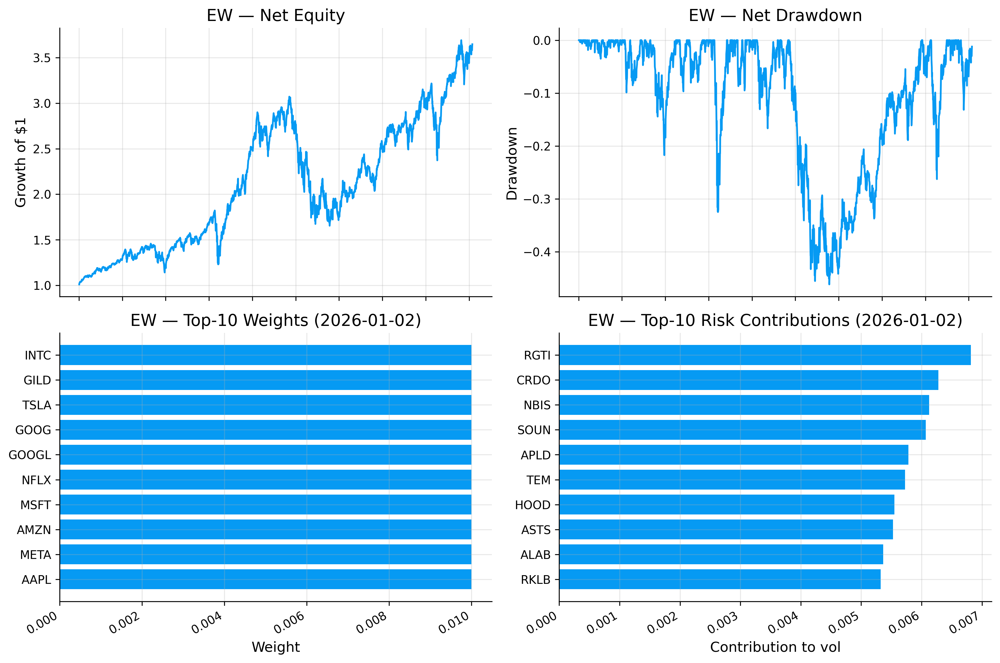

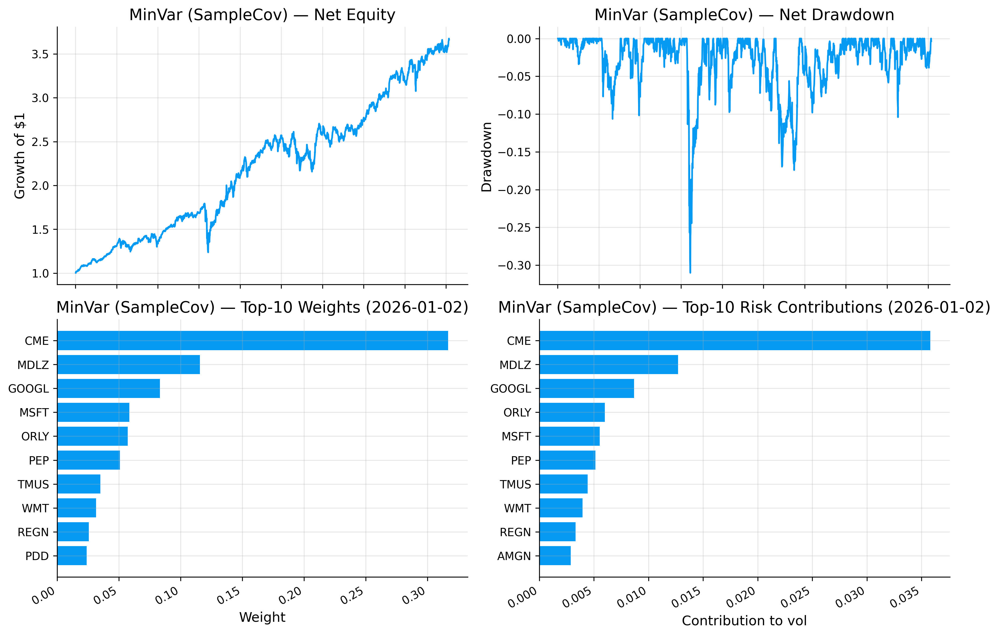

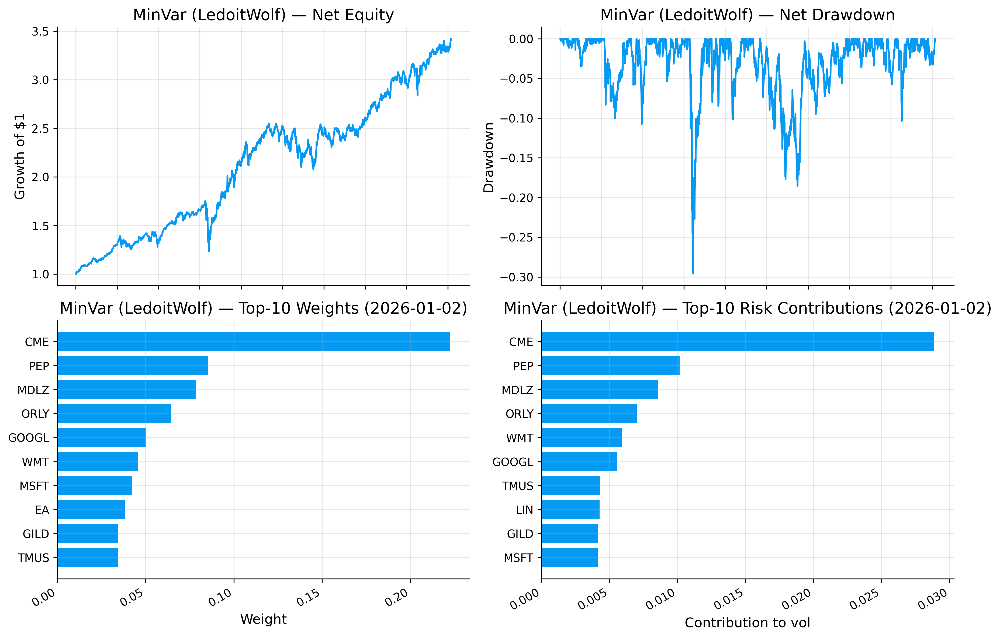

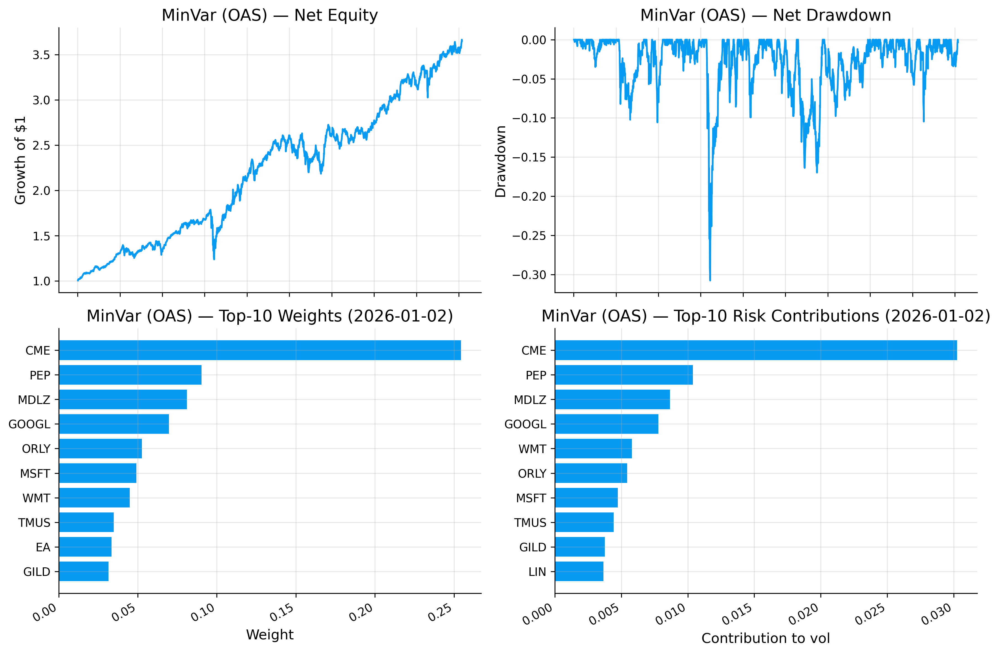

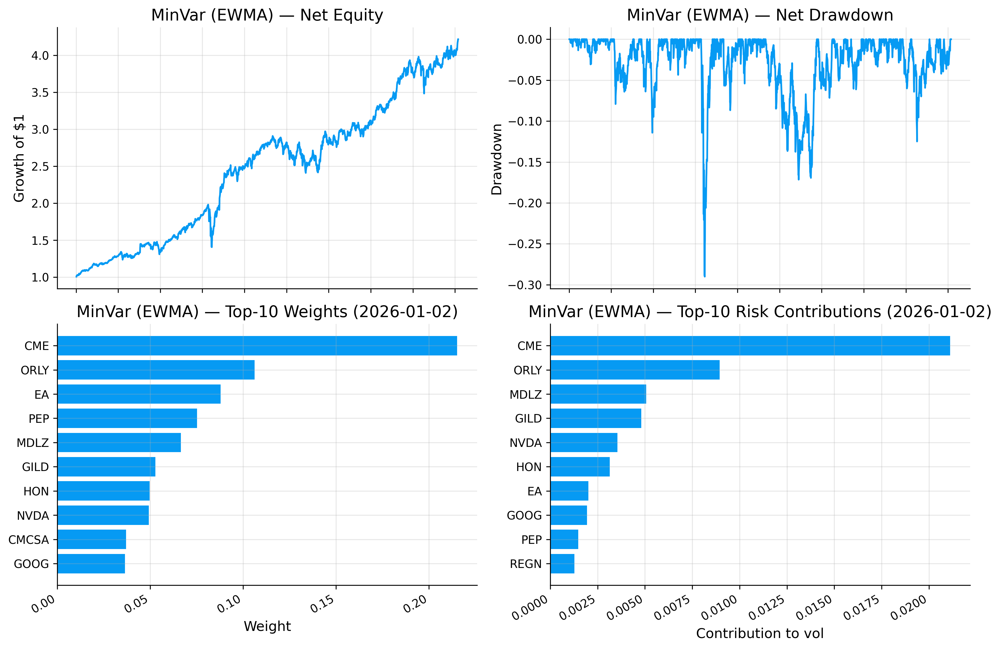

...

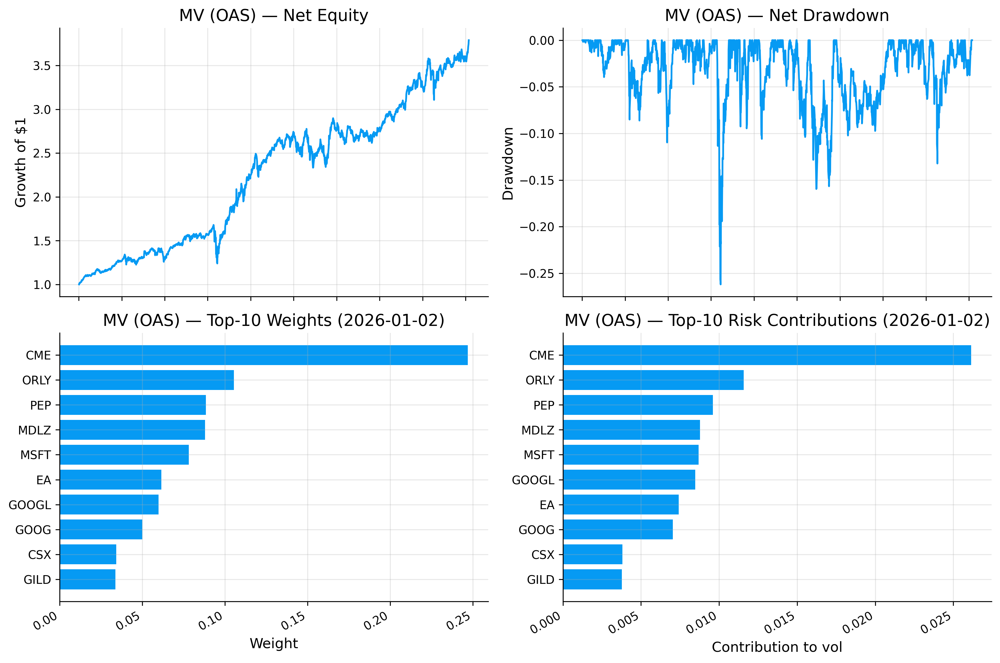

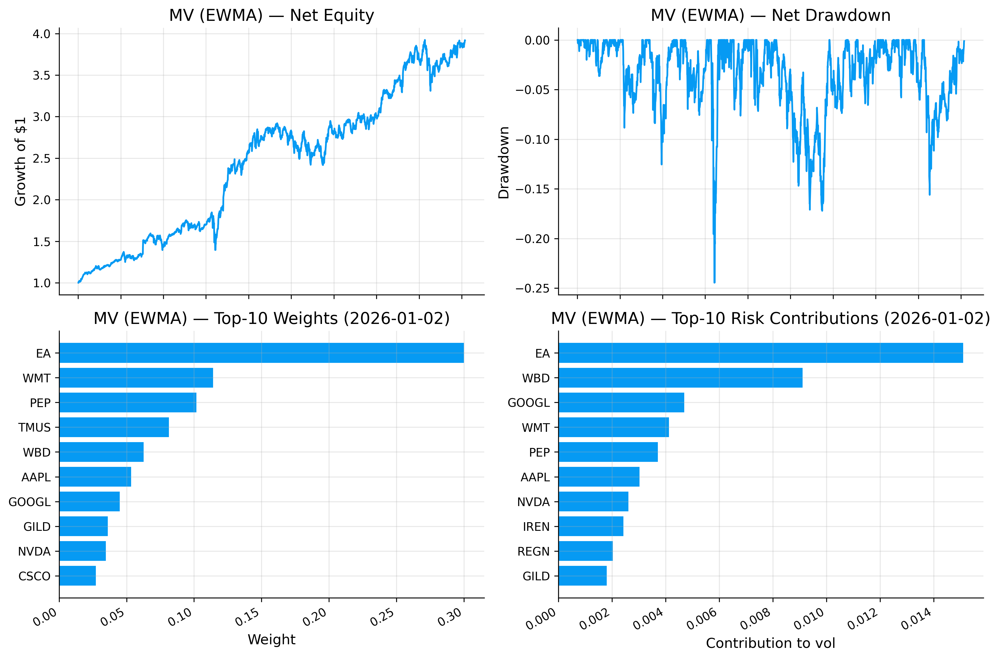

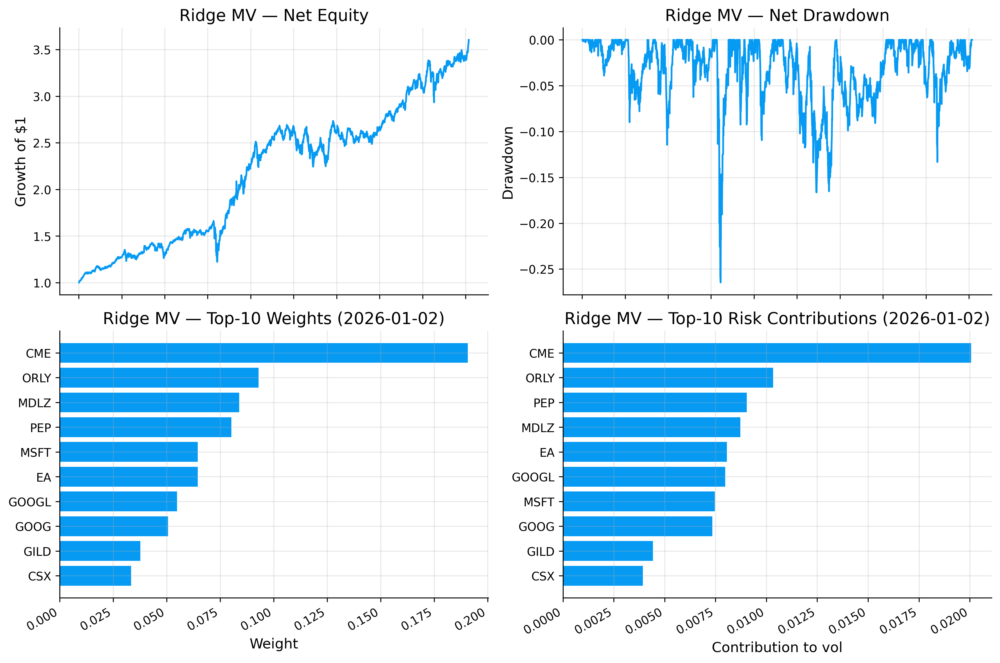

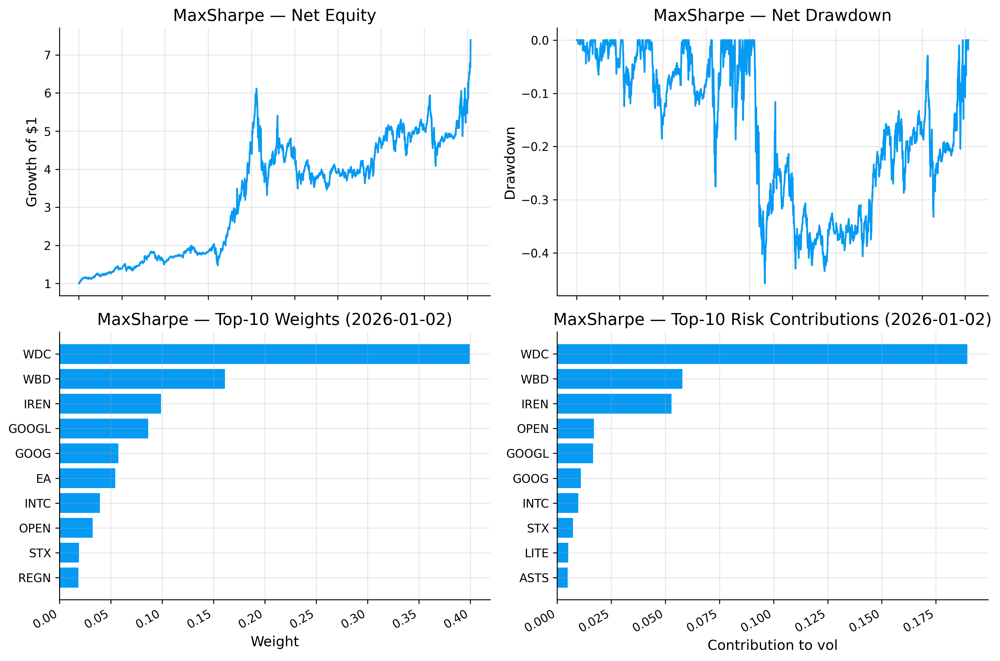

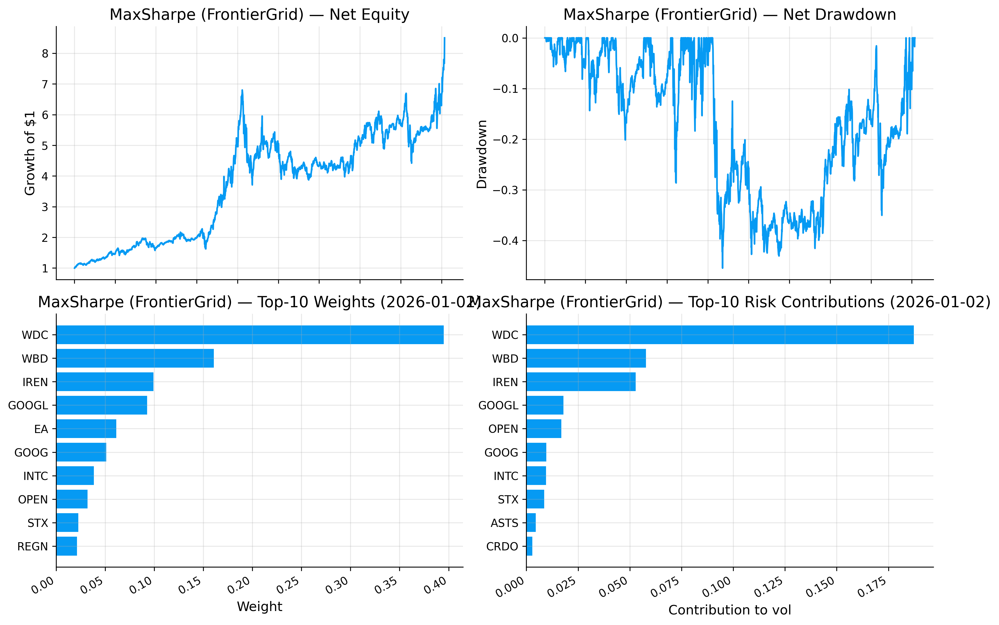

Computed strategies: ['EW', 'MinVar (SampleCov)', 'MinVar (LedoitWolf)', 'MinVar (OAS)', 'MinVar (EWMA)', 'MV (SampleCov)', 'MV (LedoitWolf)', 'MV (OAS)', 'MV (EWMA)', 'Ridge MV', 'MaxSharpe', 'MaxSharpe (FrontierGrid)']


In [26]:
results = {}

name = "EW"
results[name] = backtest_strategy(name, strategy_cov_key[name])
plot_strategy_dashboard(name, results[name], strategy_cov_key[name])

for name in ["MinVar (SampleCov)", "MinVar (LedoitWolf)", "MinVar (OAS)", "MinVar (EWMA)"]:
    results[name] = backtest_strategy(name, strategy_cov_key[name])
    plot_strategy_dashboard(name, results[name], strategy_cov_key[name])

for name in ["MV (SampleCov)", "MV (LedoitWolf)", "MV (OAS)", "MV (EWMA)"]:
    results[name] = backtest_strategy(name, strategy_cov_key[name])
    plot_strategy_dashboard(name, results[name], strategy_cov_key[name])

name = "Ridge MV"
results[name] = backtest_strategy(name, strategy_cov_key[name])
plot_strategy_dashboard(name, results[name], strategy_cov_key[name])

name = "MaxSharpe"
results[name] = backtest_strategy(name, strategy_cov_key[name])
plot_strategy_dashboard(name, results[name], strategy_cov_key[name])


name = "MaxSharpe (FrontierGrid)"
results[name] = backtest_strategy(name, strategy_cov_key[name])
plot_strategy_dashboard(name, results[name], strategy_cov_key[name])


strategy_names = list(results.keys())
print("Computed strategies:", strategy_names)


## 13) summary tables and overall plots (style preserved)

### Trading diagnostics (turnover, costs, concentration)

We compute:
- average turnover per rebalance
- total turnover
- total costs
- average HHI and effective number of holdings

$$
HHI_t = \sum_i w_{t,i}^2
\quad,\quad
N_{eff} = \frac{1}{E[HHI]}
$$


Risk/Return Summary (Net)
                            CAGR  AnnVol  Sharpe    MaxDD  Calmar Sortino
Strategy                                                                 
EW                        0.1538  0.2511  0.5351  -0.4615  0.3331  0.7017
MinVar (SampleCov)        0.1543  0.1557  0.7455  -0.3102  0.4975  0.9157
MinVar (LedoitWolf)       0.1452  0.1535  0.7022  -0.2958  0.4910  0.8632
MinVar (OAS)              0.1540  0.1548  0.7471  -0.3077  0.5006  0.9117
MinVar (EWMA)             0.1724  0.1486  0.8754  -0.2901  0.5942  1.0864
MV (SampleCov)            0.1606  0.1534  0.7921  -0.2628  0.6113  1.0223
MV (LedoitWolf)           0.1514  0.1552  0.7328  -0.2631  0.5755  0.9282
MV (OAS)                  0.1587  0.1544  0.7769  -0.2618  0.6059  0.9905
MV (EWMA)                 0.1629  0.1567  0.7900  -0.2446  0.6662  1.0038
Ridge MV                  0.1522  0.1554  0.7368  -0.2646  0.5753  0.9287
MaxSharpe                 0.2474  0.2960  0.7637  -0.4574  0.5409  0.9796
MaxSharpe (F

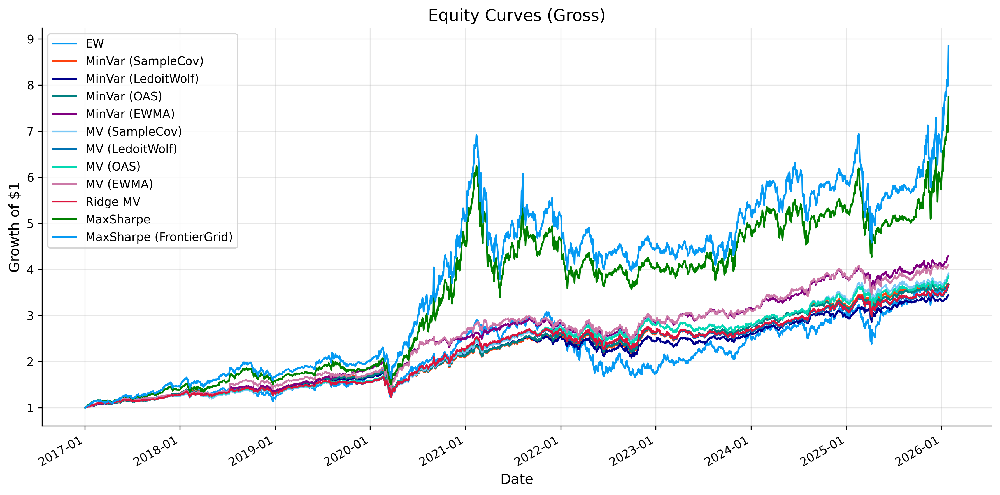

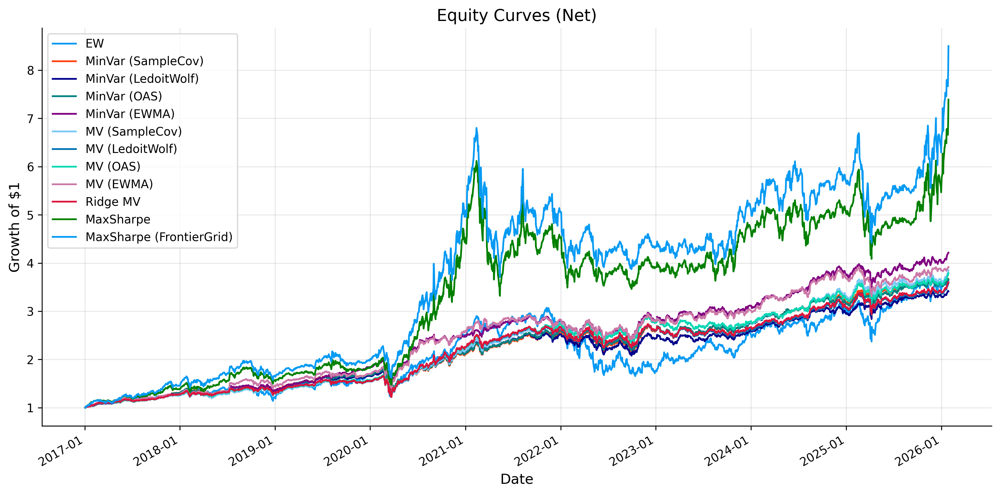

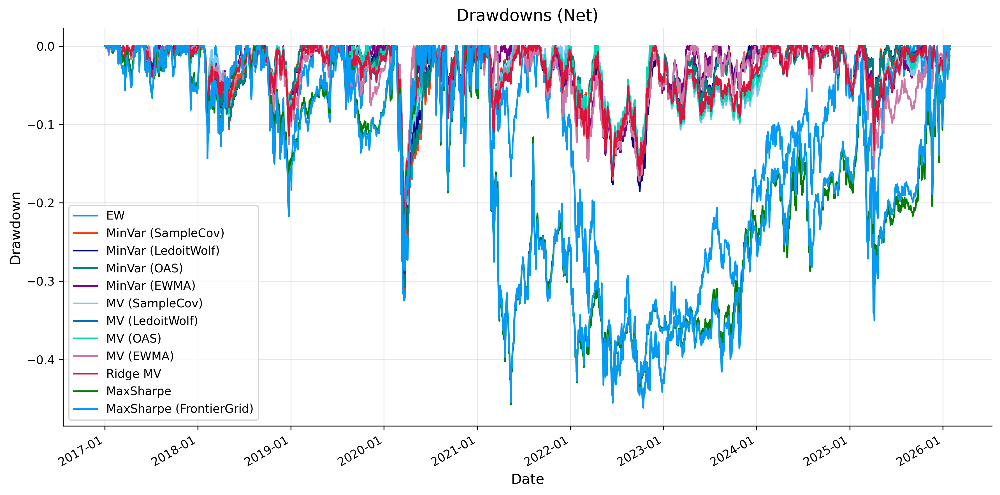

In [27]:
def calc_drawdown(series):
    return series / series.cummax() - 1.0

def performance_metrics(net_returns, net_values):
    years = len(net_returns) / 252.0
    cagr = (net_values.iloc[-1] ** (1.0 / years) - 1.0) if years > 0 else 0.0
    vol = net_returns.std() * np.sqrt(252.0)
    excess = net_returns - rf_daily
    sharpe = (excess.mean() / net_returns.std()) * np.sqrt(252.0) if net_returns.std() > 0 else np.nan
    dd = calc_drawdown(net_values)
    max_dd = dd.min()
    calmar = cagr / abs(max_dd) if max_dd < 0 else np.nan
    downside = net_returns[net_returns < 0]
    sortino = (excess.mean() / downside.std()) * np.sqrt(252.0) if downside.std() > 0 else np.nan
    return cagr, vol, sharpe, max_dd, calmar, sortino

metrics_rows = []
for name, res in results.items():
    metrics_rows.append([name, *performance_metrics(res["net_returns"], res["net_values"])])

metrics_df = pd.DataFrame(metrics_rows, columns=["Strategy", "CAGR", "AnnVol", "Sharpe", "MaxDD", "Calmar", "Sortino"]).set_index("Strategy")
print("Risk/Return Summary (Net)")
print(metrics_df.applymap(lambda x: f"{x:.4f}" if pd.notnull(x) else "NA"))

trade_rows = []
for name, res in results.items():
    turnover, costs, wdf = res["turnover"], res["costs"], res["weights"]
    if len(wdf) > 0:
        hhi = (wdf ** 2).sum(axis=1)
        avg_hhi = float(hhi.mean())
        eff_n = 1.0 / avg_hhi if avg_hhi > 0 else np.nan
    else:
        avg_hhi, eff_n = np.nan, np.nan
    trade_rows.append([
        name,
        float(turnover.mean()) if len(turnover) else 0.0,
        float(turnover.sum()) if len(turnover) else 0.0,
        float(costs.sum()) if len(costs) else 0.0,
        float(costs.sum() / res["net_values"].iloc[-1]) if len(costs) else 0.0,
        avg_hhi,
        eff_n,
    ])

trade_df = pd.DataFrame(trade_rows, columns=["Strategy", "Avg Turnover", "Total Turnover", "Total Costs", "Cost % Final Value", "Avg HHI", "Effective N"]).set_index("Strategy")
print("Trading & Stability Summary")
print(trade_df.applymap(lambda x: f"{x:.4f}" if pd.notnull(x) else "NA"))

print("Fallback counts per strategy:")
for name in strategy_names:
    print(f"{name}: {results[name]['fallbacks']}")

def plot_equity_curves(results_dict, key, title):
    plt.figure(figsize=(12, 6))
    for name, res in results_dict.items():
        s = res[key]
        plt.plot(s.index, s.values, label=name)
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Growth of $1")
    plt.grid(True, alpha=0.3)
    plt.legend()
    format_date_axis(plt.gca())
    plt.tight_layout()
    plt.show()

plot_equity_curves(results, "gross_values", "Equity Curves (Gross)")
plot_equity_curves(results, "net_values", "Equity Curves (Net)")

plt.figure(figsize=(12, 6))
for name, res in results.items():
    dd = calc_drawdown(res["net_values"])
    plt.plot(dd.index, dd.values, label=name)
plt.title("Drawdowns (Net)")
plt.xlabel("Date")
plt.ylabel("Drawdown")
plt.grid(True, alpha=0.3)
plt.legend()
format_date_axis(plt.gca())
plt.tight_layout()
plt.show()


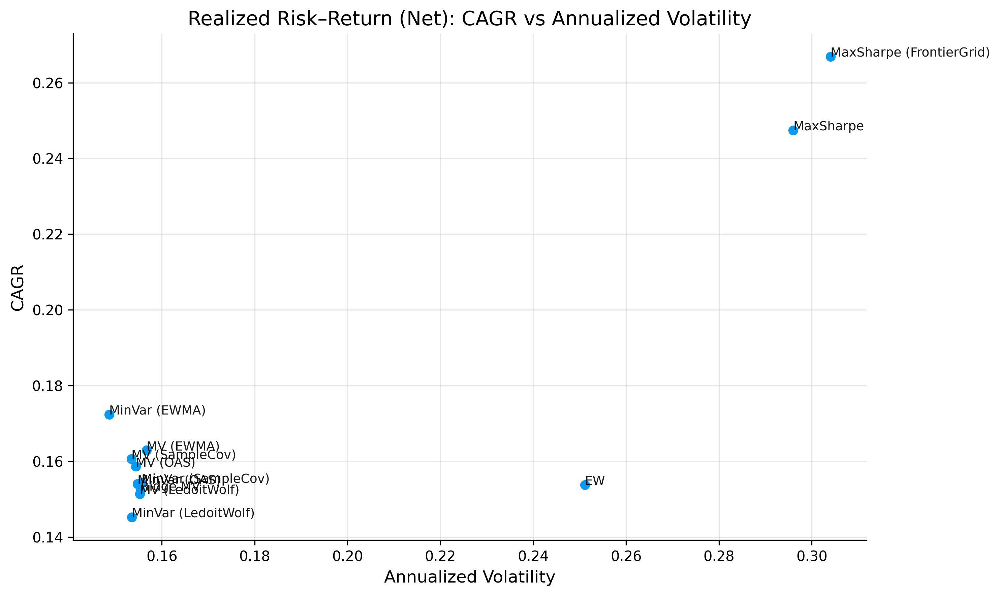

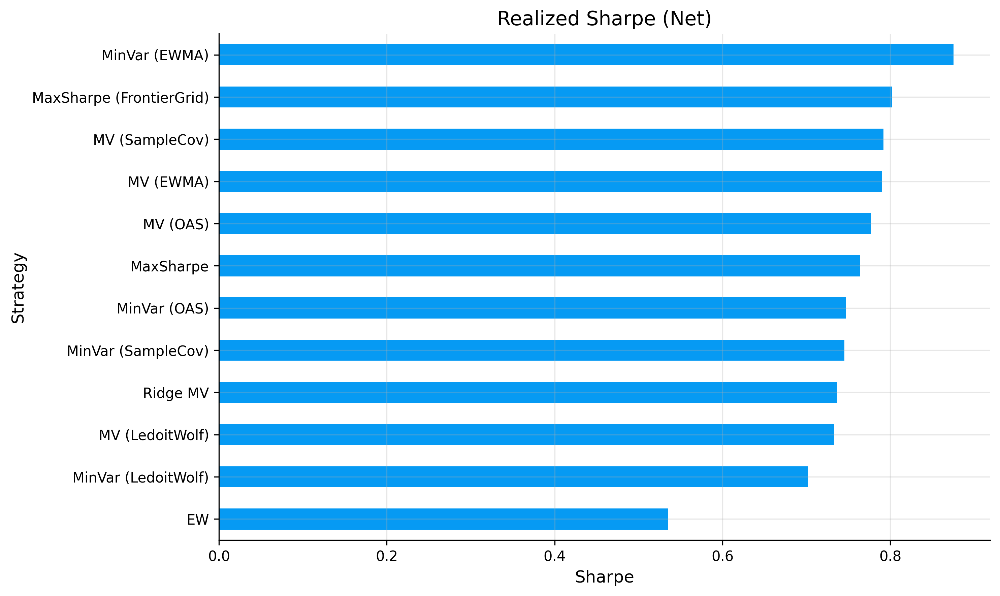

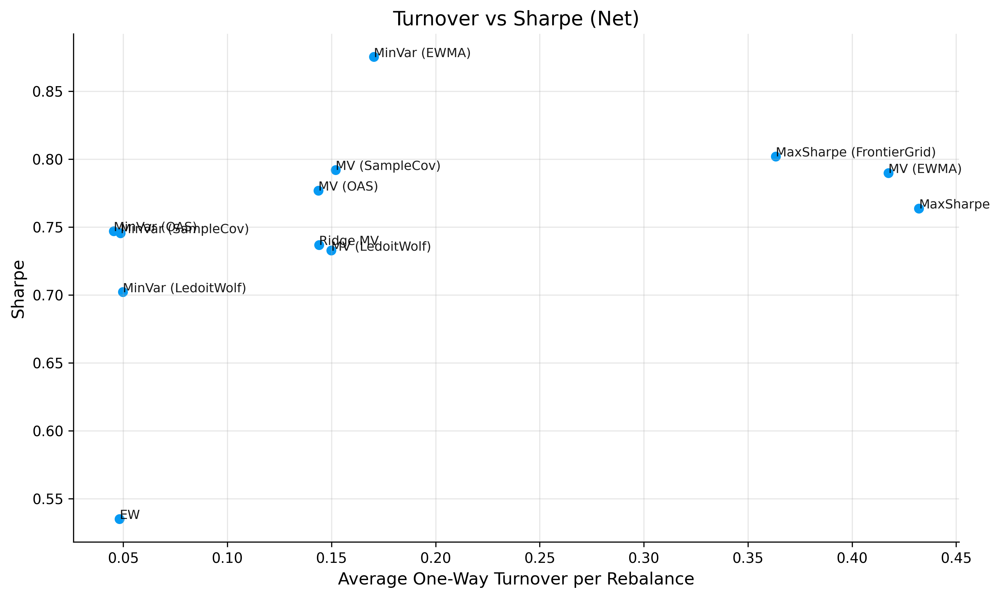

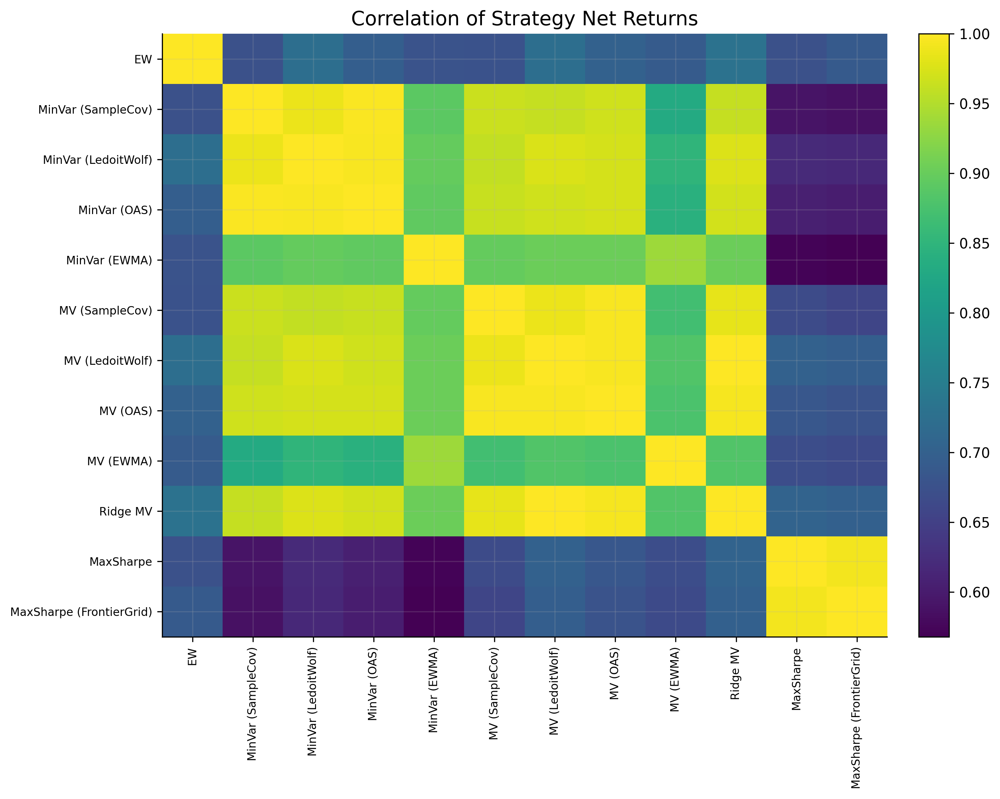

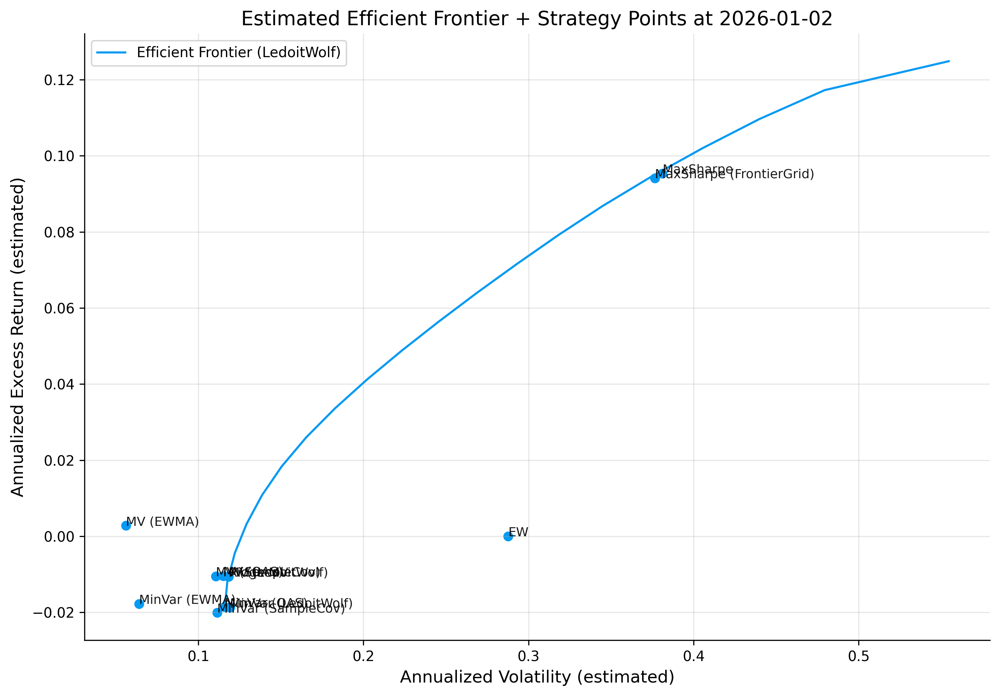

In [28]:
# =========================
# Extra comparison plots + Efficient Frontier (Estimated)
# =========================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cvxpy as cp

# ---- (A) Ensure metrics_df / trade_df exist (recompute if needed) ----
if "metrics_df" not in globals() or "trade_df" not in globals():
    def calc_drawdown(series):
        return series / series.cummax() - 1.0

    def performance_metrics(net_returns, net_values):
        years = len(net_returns) / 252.0
        cagr = (net_values.iloc[-1] ** (1.0 / years) - 1.0) if years > 0 else 0.0
        vol = net_returns.std() * np.sqrt(252.0)
        excess = net_returns - rf_daily
        sharpe = (excess.mean() / net_returns.std()) * np.sqrt(252.0) if net_returns.std() > 0 else np.nan
        dd = calc_drawdown(net_values)
        max_dd = dd.min()
        calmar = cagr / abs(max_dd) if max_dd < 0 else np.nan
        downside = net_returns[net_returns < 0]
        sortino = (excess.mean() / downside.std()) * np.sqrt(252.0) if downside.std() > 0 else np.nan
        return cagr, vol, sharpe, max_dd, calmar, sortino

    metrics_rows = []
    for name, res in results.items():
        metrics_rows.append([name, *performance_metrics(res["net_returns"], res["net_values"])])
    metrics_df = pd.DataFrame(metrics_rows, columns=["Strategy", "CAGR", "AnnVol", "Sharpe", "MaxDD", "Calmar", "Sortino"]).set_index("Strategy")

    trade_rows = []
    for name, res in results.items():
        turnover, costs, wdf = res["turnover"], res["costs"], res["weights"]
        if len(wdf) > 0:
            hhi = (wdf ** 2).sum(axis=1)
            avg_hhi = float(hhi.mean())
            eff_n = 1.0 / avg_hhi if avg_hhi > 0 else np.nan
        else:
            avg_hhi, eff_n = np.nan, np.nan
        trade_rows.append([
            name,
            float(turnover.mean()) if len(turnover) else 0.0,
            float(turnover.sum()) if len(turnover) else 0.0,
            float(costs.sum()) if len(costs) else 0.0,
            float(costs.sum() / res["net_values"].iloc[-1]) if len(costs) else 0.0,
            avg_hhi,
            eff_n,
        ])
    trade_df = pd.DataFrame(trade_rows, columns=["Strategy", "Avg Turnover", "Total Turnover", "Total Costs",
                                                 "Cost % Final Value", "Avg HHI", "Effective N"]).set_index("Strategy")

# ---- (B) More comparison plots ----

# 1) Realized risk-return scatter (CAGR vs AnnVol)
plt.figure(figsize=(10, 6))
plt.scatter(metrics_df["AnnVol"], metrics_df["CAGR"])
for s in metrics_df.index:
    plt.annotate(s, (metrics_df.loc[s, "AnnVol"], metrics_df.loc[s, "CAGR"]), fontsize=9, alpha=0.9)
plt.title("Realized Risk–Return (Net): CAGR vs Annualized Volatility")
plt.xlabel("Annualized Volatility")
plt.ylabel("CAGR")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Sharpe bar chart
plt.figure(figsize=(10, 6))
metrics_df["Sharpe"].sort_values().plot(kind="barh")
plt.title("Realized Sharpe (Net)")
plt.xlabel("Sharpe")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 3) Turnover vs Sharpe scatter
df_ts = metrics_df[["Sharpe"]].join(trade_df[["Avg Turnover"]], how="left")
plt.figure(figsize=(10, 6))
plt.scatter(df_ts["Avg Turnover"], df_ts["Sharpe"])
for s in df_ts.index:
    plt.annotate(s, (df_ts.loc[s, "Avg Turnover"], df_ts.loc[s, "Sharpe"]), fontsize=9, alpha=0.9)
plt.title("Turnover vs Sharpe (Net)")
plt.xlabel("Average One-Way Turnover per Rebalance")
plt.ylabel("Sharpe")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 4) Correlation heatmap of strategy net returns
ret_mat = pd.concat({k: v["net_returns"] for k, v in results.items()}, axis=1).dropna(how="any")
corr = ret_mat.corr()

plt.figure(figsize=(10, 8))
im = plt.imshow(corr.values, aspect="auto")
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(range(len(corr.columns)), corr.columns, rotation=90, fontsize=8)
plt.yticks(range(len(corr.index)), corr.index, fontsize=8)
plt.title("Correlation of Strategy Net Returns")
plt.tight_layout()
plt.show()


# ---- (C) Efficient frontier (estimated) + strategy points ----
# Uses latest common rebalance date (so everyone is comparable)

def last_common_rebalance_date(results_dict):
    common = None
    for res in results_dict.values():
        idx = res["weights"].index
        if len(idx) == 0:
            continue
        s = set(idx)
        common = s if common is None else (common & s)
    if not common:
        return None
    return max(common)

dt0 = last_common_rebalance_date(results)
if dt0 is None or dt0 not in cache:
    print_warn("Could not find a common rebalance date in results/cache for frontier plotting.")
else:
    st = cache[dt0]
    tickers = st["tickers"]
    mu_ex = st["mu_excess_ann"].astype(np.float64)
    mu_use = (1.0 - MU_SHRINK) * mu_ex if APPLY_MU_SHRINK else mu_ex

    # You can change which covariance you want the frontier for (fastest: LedoitWolf)
    FRONTIER_COV_KEY = "LedoitWolf"   # try: "SampleCov", "OAS", "EWMA"
    Sigma = st["cov_ann_map"][FRONTIER_COV_KEY].astype(np.float64)
    Sigma = 0.5 * (Sigma + Sigma.T)

    # QP helpers (OSQP is fast)
    def solve_minvar_no_return(Sigma):
        n = Sigma.shape[0]
        w = cp.Variable(n)
        cons = []
        if LONG_ONLY:
            cons.append(w >= 0)
        if W_MIN is not None:
            cons.append(w >= W_MIN)
        if W_MAX is not None:
            cons.append(w <= W_MAX)
        cons.append(cp.sum(w) == 1)
        prob = cp.Problem(cp.Minimize(cp.quad_form(w, Sigma)), cons)
        try:
            prob.solve(solver="OSQP", warm_start=True, max_iter=MAX_ITER)
        except Exception:
            prob.solve(solver="ECOS", warm_start=True, max_iters=MAX_ITER)
        if w.value is None:
            return None
        wv = np.asarray(w.value, dtype=np.float64).flatten()
        return None if np.any(~np.isfinite(wv)) else wv

    def solve_minvar_target_return(mu, Sigma, r_target):
        n = Sigma.shape[0]
        w = cp.Variable(n)
        cons = []
        if LONG_ONLY:
            cons.append(w >= 0)
        if W_MIN is not None:
            cons.append(w >= W_MIN)
        if W_MAX is not None:
            cons.append(w <= W_MAX)
        cons.append(cp.sum(w) == 1)
        cons.append(mu @ w >= r_target)
        prob = cp.Problem(cp.Minimize(cp.quad_form(w, Sigma)), cons)
        try:
            prob.solve(solver="OSQP", warm_start=True, max_iter=MAX_ITER)
        except Exception:
            prob.solve(solver="ECOS", warm_start=True, max_iters=MAX_ITER)
        if w.value is None:
            return None
        wv = np.asarray(w.value, dtype=np.float64).flatten()
        return None if np.any(~np.isfinite(wv)) else wv

    # Cheap upper bound for max achievable return under bounds (greedy fill)
    def greedy_max_return(mu, w_max):
        n = len(mu)
        order = np.argsort(mu)[::-1]
        w = np.zeros(n, dtype=np.float64)
        remaining = 1.0
        cap = np.inf if w_max is None else float(w_max)
        for i in order:
            if remaining <= 1e-12:
                break
            add = min(cap, remaining)
            w[i] = add
            remaining -= add
        # if constraints infeasible due to too small w_max, return None
        if remaining > 1e-6:
            return None
        return w

    w_minv = solve_minvar_no_return(Sigma)
    w_maxr = greedy_max_return(mu_use, W_MAX)

    if w_minv is None or w_maxr is None:
        print_warn("Frontier endpoints infeasible; check W_MAX / constraints.")
    else:
        r_lo = float(mu_use @ w_minv)
        r_hi = float(mu_use @ w_maxr)

        # Frontier grid
        N_FRONTIER = 20  # increase for smoother curve (more QP solves)
        targets = np.linspace(r_lo, r_hi, N_FRONTIER)

        fr_vol, fr_ret = [], []
        for rt in targets:
            wv = solve_minvar_target_return(mu_use, Sigma, rt)
            if wv is None:
                continue
            v = float(np.sqrt(max(wv @ Sigma @ wv, 1e-18)))
            r = float(mu_use @ wv)
            fr_vol.append(v); fr_ret.append(r)

        # Strategy points at dt0 using their own cov choice (for x-axis risk), but same mu_use for y-axis
        pts = []
        for name, res in results.items():
            if dt0 not in res["weights"].index:
                continue
            w_row = res["weights"].loc[dt0].reindex(tickers).fillna(0.0).values.astype(np.float64)
            cov_key = strategy_cov_key.get(name, FRONTIER_COV_KEY)
            Sig_i = st["cov_ann_map"][cov_key].astype(np.float64)
            Sig_i = 0.5 * (Sig_i + Sig_i.T)
            vol_i = float(np.sqrt(max(w_row @ Sig_i @ w_row, 1e-18)))
            ret_i = float(mu_use @ w_row)
            pts.append((name, vol_i, ret_i))

        # Plot: Efficient Frontier + strategies
        plt.figure(figsize=(10, 7))
        if len(fr_vol) > 1:
            plt.plot(fr_vol, fr_ret, label=f"Efficient Frontier ({FRONTIER_COV_KEY})")
        if len(pts) > 0:
            xs = [p[1] for p in pts]
            ys = [p[2] for p in pts]
            plt.scatter(xs, ys)
            for name, x, y in pts:
                plt.annotate(name, (x, y), fontsize=9, alpha=0.9)

        plt.title(f"Estimated Efficient Frontier + Strategy Points at {dt0.date()}")
        plt.xlabel("Annualized Volatility (estimated)")
        plt.ylabel("Annualized Excess Return (estimated)")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()
